# Loading Dataset

In [2]:
import pandas as pd
import numpy as np


df = pd.read_csv('dataset.csv')

# Dataset Preparation

In [3]:
df.columns = [x.lower() for x in df.columns]

# Remove the 'id' column
df = df.drop(columns=['id'])


df

,n_days,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,status
0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D
1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C
2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D
3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C
4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7900,1166,D-penicillamine,16839,F,N,N,N,N,0.8,309.0,3.56,38.0,1629.0,79.05,224.0,344.0,9.9,2.0,C
7901,1492,Placebo,17031,F,N,Y,N,N,0.9,260.0,3.43,62.0,1440.0,142.00,78.0,277.0,10.0,4.0,C
7902,1576,D-penicillamine,25873,F,N,N,Y,S,2.0,225.0,3.19,51.0,933.0,69.75,62.0,200.0,12.7,2.0,D
7903,3584,D-penicillamine,22960,M,N,Y,N,N,0.7,248.0,2.75,32.0,1003.0,57.35,118.0,221.0,10.6,4.0,D


In [4]:
import pandas as pd

# Variable descriptions
variable_descriptions = {
    'id': 'Unique identifier',
    'n_aays': 'Number of days between registration and the earlier of death, transplantation, or study analysis time in July 1986',
    'status': 'Status of the patient (C: censored, CL: censored due to liver tx, or D: death)',
    'drug': 'Type of drug (D-penicillamine or placebo)',
    'age': 'Age in days',
    'sex': 'Gender (M: male or F: female)',
    'ascites': 'Presence of ascites (N: No or Y: Yes)',
    'hepatomegaly': 'Presence of hepatomegaly (N: No or Y: Yes)',
    'spiders': 'Presence of spiders (N: No or Y: Yes)',
    'edema': 'Presence of edema (N: no edema and no diuretic therapy for edema, S: edema present without diuretics, or Y: edema despite diuretic therapy)',
    'bilirubin': 'Serum bilirubin in mg/dl',
    'cholesterol': 'Serum cholesterol in mg/dl',
    'albumin': 'Albumin in gm/dl',
    'copper': 'Urine copper in ug/day',
    'alk_Phos': 'Alkaline phosphatase in U/liter',
    'sgot': 'SGOT in U/ml',
    'triglycerides': 'Triglycerides in mg/dl',
    'platelets': 'Platelets per cubic ml/1000',
    'prothrombin': 'Prothrombin time in seconds (s)',
    'stage': 'Histologic stage of disease (1, 2, 3, or 4)'
}

# Create the DataFrame for the information table
info_table = pd.DataFrame({
    'Description': [variable_descriptions.get(col, 'Unknown') for col in df.columns],
    'Data Type': df.dtypes,
    'Non-Null Count': df.notnull().sum(),
    'Number of Missing Values': df.isnull().sum()
})

info_table


,Description,Data Type,Non-Null Count,Number of Missing Values
n_days,Unknown,int64,7905,0
drug,Type of drug (D-penicillamine or placebo),object,7905,0
age,Age in days,int64,7905,0
sex,Gender (M: male or F: female),object,7905,0
ascites,Presence of ascites (N: No or Y: Yes),object,7905,0
hepatomegaly,Presence of hepatomegaly (N: No or Y: Yes),object,7905,0
spiders,Presence of spiders (N: No or Y: Yes),object,7905,0
edema,Presence of edema (N: no edema and no diuretic...,object,7905,0
bilirubin,Serum bilirubin in mg/dl,float64,7905,0
cholesterol,Serum cholesterol in mg/dl,float64,7905,0


In [5]:
from tabulate import tabulate

info_table = tabulate(df.info(), headers='keys', tablefmt='pretty')

info_table


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7905 entries, 0 to 7904
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   n_days         7905 non-null   int64  
 1   drug           7905 non-null   object 
 2   age            7905 non-null   int64  
 3   sex            7905 non-null   object 
 4   ascites        7905 non-null   object 
 5   hepatomegaly   7905 non-null   object 
 6   spiders        7905 non-null   object 
 7   edema          7905 non-null   object 
 8   bilirubin      7905 non-null   float64
 9   cholesterol    7905 non-null   float64
 10  albumin        7905 non-null   float64
 11  copper         7905 non-null   float64
 12  alk_phos       7905 non-null   float64
 13  sgot           7905 non-null   float64
 14  tryglicerides  7905 non-null   float64
 15  platelets      7905 non-null   float64
 16  prothrombin    7905 non-null   float64
 17  stage          7905 non-null   float64
 18  status  

''

In [6]:
# Descriptive Analysis
df.describe().T

,count,mean,std,min,25%,50%,75%,max
n_days,7905.0,2030.173308,1094.233744,41.00,1230.00,1831.00,2689.00,4795.00
age,7905.0,18373.146490,3679.958739,9598.00,15574.00,18713.00,20684.00,28650.00
bilirubin,7905.0,2.594485,3.812960,0.30,0.70,1.10,3.00,28.00
cholesterol,7905.0,350.561923,195.379344,120.00,248.00,298.00,390.00,1775.00
albumin,7905.0,3.548323,0.346171,1.96,3.35,3.58,3.77,4.64
copper,7905.0,83.902846,75.899266,4.00,39.00,63.00,102.00,588.00
alk_phos,7905.0,1816.745250,1903.750657,289.00,834.00,1181.00,1857.00,13862.40
sgot,7905.0,114.604602,48.790945,26.35,75.95,108.50,137.95,457.25
tryglicerides,7905.0,115.340164,52.530402,33.00,84.00,104.00,139.00,598.00
platelets,7905.0,265.228969,87.465579,62.00,211.00,265.00,316.00,563.00


In [7]:
# Create a DataFrame to store the count of missing values in each column
missing_values_table = pd.DataFrame(df.isnull().sum(), columns=['Count'])

# Reset the index to make 'Column' a regular column
missing_values_table.reset_index(inplace=True)

# Rename the columns for clarity
missing_values_table.rename(columns={'index': 'Column'}, inplace=True)

# Count the number of duplicated rows
duplicated_rows_count = df.duplicated().sum()

# Create a list to store unique values count for categorical variables
unique_values_table = []

# Iterate over each column with object data type (categorical variables)
for col in df.select_dtypes(include=['object']):
    # Append the column name and its unique values count to the list
    unique_values_table.append([col, df[col].nunique()])

# Print the count of unique values for categorical variables
print("\nCount of Unique Values for Categorical Variables:")
print(tabulate(unique_values_table, headers=['Column', 'Count'], tablefmt='fancy_grid'))




Count of Unique Values for Categorical Variables:
╒══════════════╤═════════╕
│ Column       │   Count │
╞══════════════╪═════════╡
│ drug         │       2 │
├──────────────┼─────────┤
│ sex          │       2 │
├──────────────┼─────────┤
│ ascites      │       2 │
├──────────────┼─────────┤
│ hepatomegaly │       2 │
├──────────────┼─────────┤
│ spiders      │       2 │
├──────────────┼─────────┤
│ edema        │       3 │
├──────────────┼─────────┤
│ status       │       3 │
╘══════════════╧═════════╛


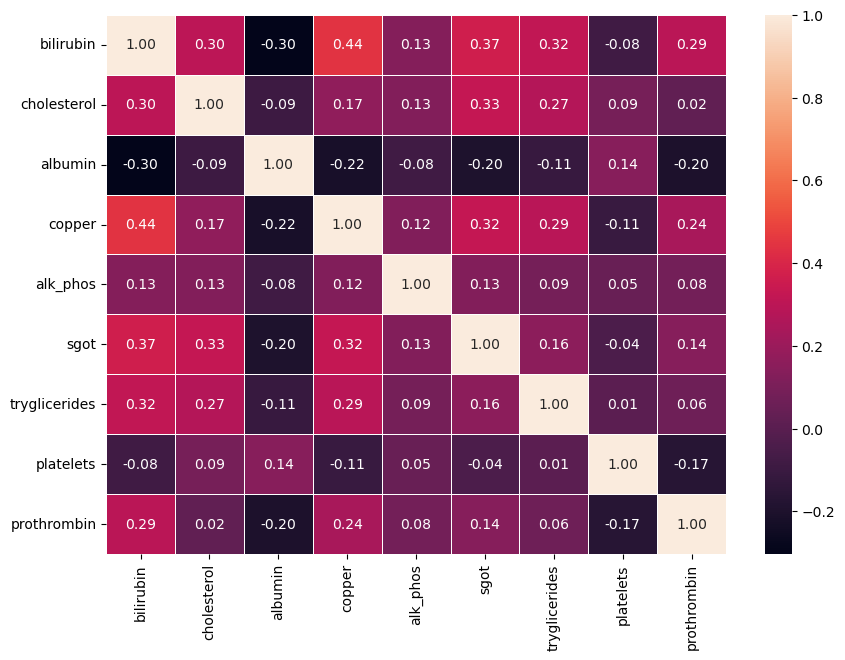

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

selected_features = [
    
    'bilirubin', 'cholesterol', 'albumin', 'copper', 'alk_phos', 'sgot',
    'tryglicerides', 'platelets', 'prothrombin'
]

# Create a subset correlation matrix for the selected features
subset_correlation_matrix = df[selected_features].corr()

# Plot the heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(
    subset_correlation_matrix,
    annot=True,
    fmt=".2f",
    linewidths=.5
)

plt.show()

In [9]:
from datetime import datetime, timedelta

# Convert ages from days to date format
df['age'] = [(datetime.today() - timedelta(days=age)).strftime('%Y-%m-%d') for age in df['age']]

# Save the modified DataFrame back to a new CSV file
df.to_csv('modified_dataset.csv', index=False)


In [10]:
# Converting Target categories into intigers 1 for Cirrhosis, 0 otherwise
df['stage'] = np.where(df['stage'] == 4, 1, 0)

# EDA Section

In [11]:
import pandas as pd
import plotly.express as px

# Assuming 'stage' is the column containing the stages information
stage_counts = df['stage'].value_counts()

total_count = stage_counts.sum()
percentages = [(count / total_count) * 100 for count in stage_counts]

df_stage_plot = pd.DataFrame({
    'Stage': stage_counts.index,
    'Percentage': percentages
})

fig = px.pie(df_stage_plot,
             names='Stage',
             values='Percentage',
             title='Number of Example Per Class',
             hole=0.4,
             labels={'Percentage': '%'})

fig.show()


In [12]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Convert 'age' column to datetime
df['age'] = pd.to_datetime(df['age'])

# Calculate the age of each individual
current_year = pd.Timestamp.now().year
df['Age'] = current_year - df['age'].dt.year

# Define age groups
def age_group(age):
    if age < 18:
        return 'Under 18'
    elif 18 <= age < 30:
        return '18-29'
    elif 30 <= age < 40:
        return '30-39'
    elif 40 <= age < 50:
        return '40-49'
    elif 50 <= age < 60:
        return '50-59'
    else:
        return '60 and above'

# Apply age_group function to create 'Age Group' column
df['Age Group'] = df['Age'].apply(age_group)

# Define a color palette with different colors for each age group
color_palette = px.colors.qualitative.Pastel

# Create a dictionary to map each age group to a color
color_map = dict(zip(df['Age Group'].unique(), color_palette))

# Create a bar chart
fig = go.Figure()

for age_group, group_df in df.groupby('Age Group'):
    fig.add_trace(go.Bar(
        x=[age_group],
        y=[len(group_df)],
        name=age_group,
        marker_color=color_map[age_group]
    ))

fig.update_layout(
    title='Distribution of Age Groups',
    xaxis=dict(title='Age Group'),
    yaxis=dict(title='Frequency'),
    barmode='group',
    plot_bgcolor='white',
    font=dict(color='black')
)

fig.show()


In [ ]:
# Define the biochemical markers to compare
biochemical_markers = ['Age Group', 'sex', 'ascites', 'drug', 'hepatomegaly', 'spiders', 'edema']

# Create histograms for each biochemical marker grouped by cirrhosis stage
for marker in biochemical_markers:
    fig = px.histogram(df, x=marker, color='stage', 
                       title=f'{marker.capitalize()} Features with their relation with the disease',
                       labels={'stage': 'Cirrhosis Stage', marker: marker.capitalize()},
                       marginal='rug')
    
    fig.show()


In [ ]:
# Convert 'age' column to datetime format
df['age'] = pd.to_datetime(df['age'])

# Calculate the age in days by subtracting the minimum date from each date
min_date = df['age'].min()
df['age'] = (df['age'] - min_date).dt.days

# Drop 'Age' and 'Age Group' columns
df = df.drop(columns=['Age', 'Age Group'])

df.head()

,n_days,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,status
0,999,D-penicillamine,7118,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,0,D
1,2574,Placebo,9413,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,0,C
2,3428,Placebo,14923,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,1,D
3,2576,Placebo,10190,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,0,C
4,788,Placebo,11992,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,1,C


# Feature Engineering 

In [ ]:
# Create the grouped bar plot
fig = go.Figure()

# Add Platelets data
fig.add_trace(go.Bar(x=['Platelets'], y=[df['platelets'].corr(df['stage'])], name='Platelets', marker_color='black'))

# Add Albumin data
fig.add_trace(go.Bar(x=['Albumin'], y=[df['albumin'].corr(df['stage'])], name='Albumin', marker_color='green'))

# Add Cholesterol data
fig.add_trace(go.Bar(x=['Cholesterol'], y=[df['cholesterol'].corr(df['stage'])], name='Cholesterol', marker_color='red'))

# Update layout
fig.update_layout(title='Cirrhosis Probability Correlation with Platelets, Albumin, and Cholesterol',
                  xaxis_title='Feature', yaxis_title='Correlation with Cirrhosis Probability', barmode='group',
                  plot_bgcolor='white', legend_title='Feature', showlegend=True)

fig.show()

In [ ]:
# Calculate correlation coefficients
correlation_coefficients = {
    'Feature': ['Platelets', 'Albumin', 'Cholesterol'],
    'Correlation with Cirrhosis Probability': [
        df['platelets'].corr(df['stage']),
        df['albumin'].corr(df['stage']),
        df['cholesterol'].corr(df['stage'])
    ]
}

# Create the table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Feature', 'Correlation with Cirrhosis Probability'],
                fill_color='royalblue',
                align='left',
                font=dict(color='white', size=14)),
    cells=dict(values=[correlation_coefficients['Feature'], correlation_coefficients['Correlation with Cirrhosis Probability']],
               fill_color='white',
               align='left',
               font=dict(color='black', size=12)))
])

# Update layout
fig.update_layout(title='Correlation with Cirrhosis Probability for Platelets, Albumin, and Cholesterol')

# Show the table
fig.show()

In [17]:
import plotly.graph_objects as go

# Calculate correlation coefficients for Age, Prothrombin, and Copper
correlation_coefficients = {
    'Feature': ['Age', 'Prothrombin', 'Copper'],
    'Correlation with Cirrhosis Probability': [
        df['age'].corr(df['stage']),
        df['prothrombin'].corr(df['stage']),
        df['copper'].corr(df['stage'])
    ]
}

# Create the grouped bar plot
fig = go.Figure()

# Add Age data
fig.add_trace(go.Bar(x=['Age'], y=[correlation_coefficients['Correlation with Cirrhosis Probability'][0]], name='Age', marker_color='blue'))

# Add Prothrombin data
fig.add_trace(go.Bar(x=['Prothrombin'], y=[correlation_coefficients['Correlation with Cirrhosis Probability'][1]], name='Prothrombin', marker_color='orange'))

# Add Copper data
fig.add_trace(go.Bar(x=['Copper'], y=[correlation_coefficients['Correlation with Cirrhosis Probability'][2]], name='Copper', marker_color='purple'))

# Update layout
fig.update_layout(title='Cirrhosis Probability Correlation with Age, Prothrombin, and Copper',
                  xaxis_title='Feature', yaxis_title='Correlation with Cirrhosis Probability', barmode='group',
                  plot_bgcolor='white', legend_title='Feature', showlegend=True)

# Show the plot
fig.show()


In [18]:
import plotly.graph_objects as go

# Calculate correlation coefficients for Age, Prothrombin, and Copper
correlation_coefficients = {
    'Feature': ['Age', 'Prothrombin', 'Copper'],
    'Correlation with Cirrhosis Probability': [
        df['age'].corr(df['stage']),
        df['prothrombin'].corr(df['stage']),
        df['copper'].corr(df['stage'])
    ]
}

# Create the table
fig = go.Figure(data=[go.Table(
    header=dict(values=['Feature', 'Correlation with Cirrhosis Probability'],
                fill_color='royalblue',
                align='left',
                font=dict(color='white', size=14)),
    cells=dict(values=[correlation_coefficients['Feature'], correlation_coefficients['Correlation with Cirrhosis Probability']],
               fill_color='white',
               align='left',
               font=dict(color='black', size=12)))
])

# Update layout
fig.update_layout(title='Correlation with Cirrhosis Probability for Age, Prothrombin, and Copper')

# Show the table
fig.show()


In [19]:
# Define the biochemical markers to compare
biochemical_markers = ['bilirubin','age', 'cholesterol', 'albumin', 'copper', 'sgot', 'tryglicerides', 'platelets', 'prothrombin']

# Create histograms for each biochemical marker grouped by cirrhosis status
for marker in biochemical_markers:
    fig = px.histogram(df, x=marker, color='stage', 
                       title=f'{marker.capitalize()} Distribution by Cirrhosis Stage',
                       labels={'stage': 'Cirrhosis Stage', marker: marker.capitalize()},
                       marginal='rug')
    
    # Show plot
    fig.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


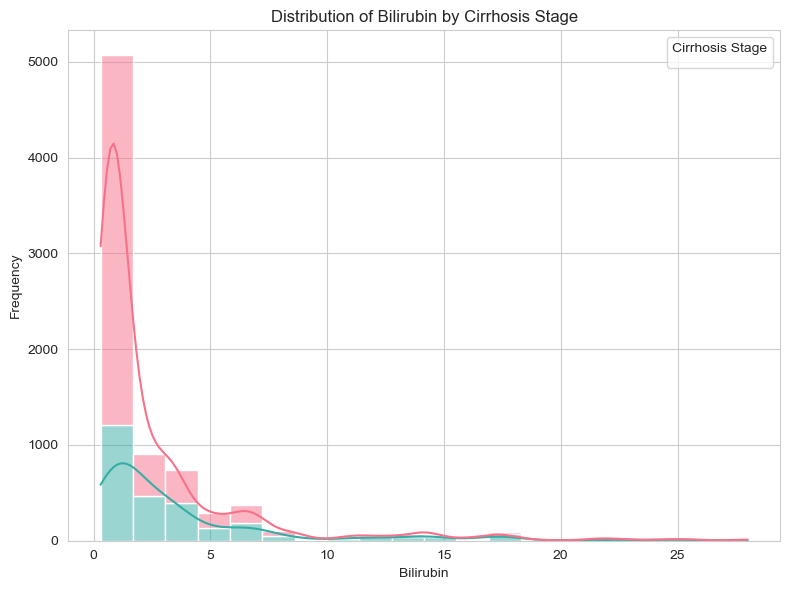

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


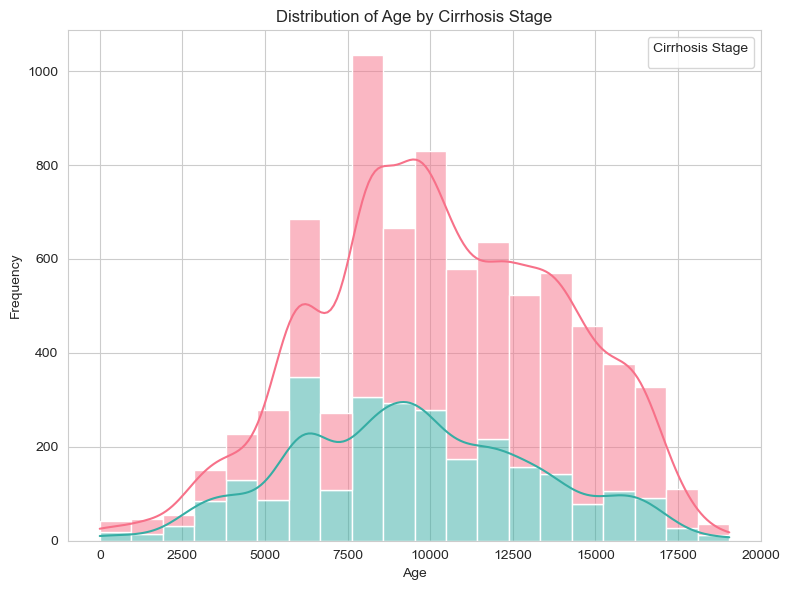

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


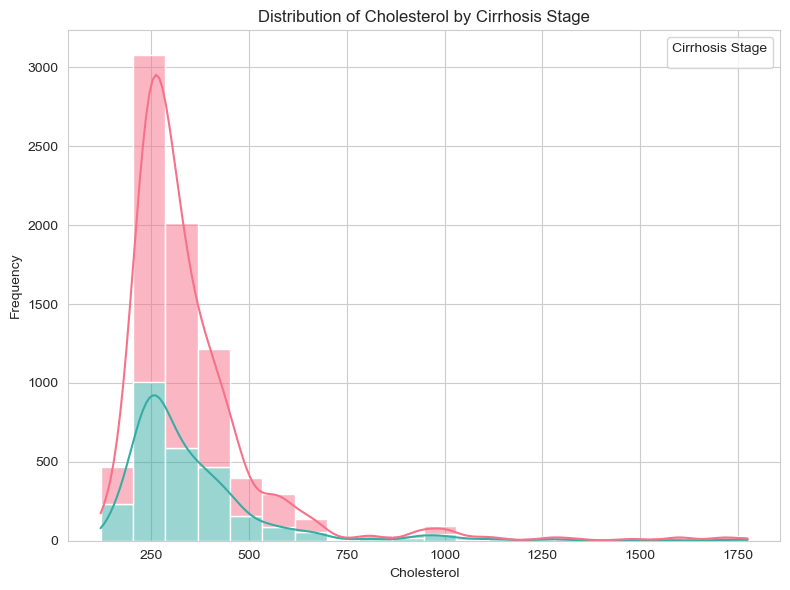

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


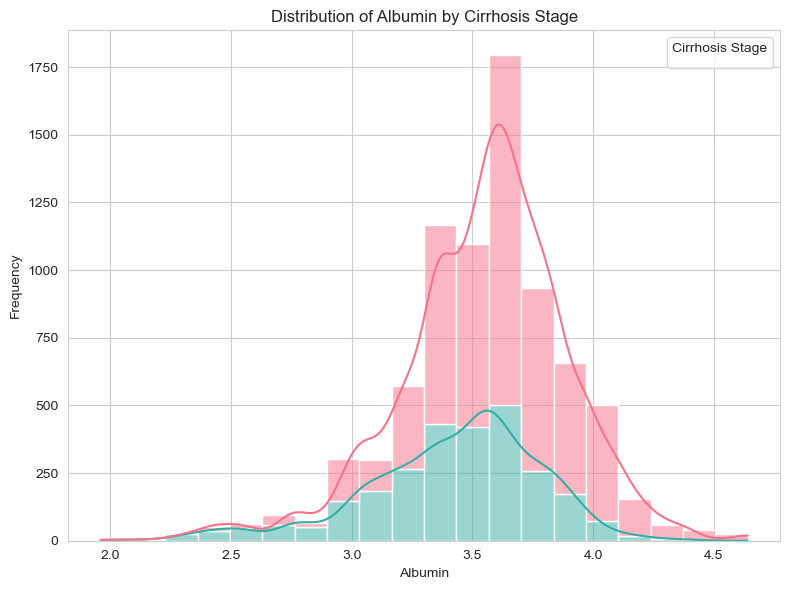

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


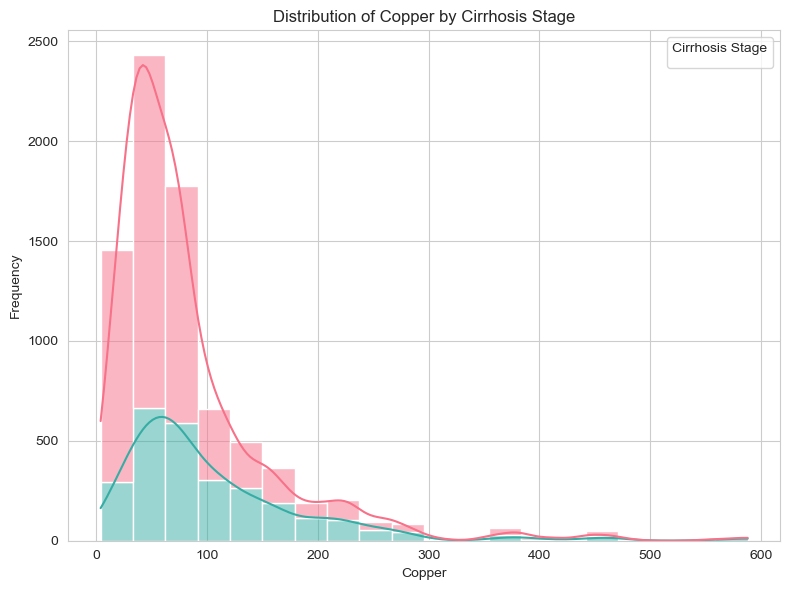

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


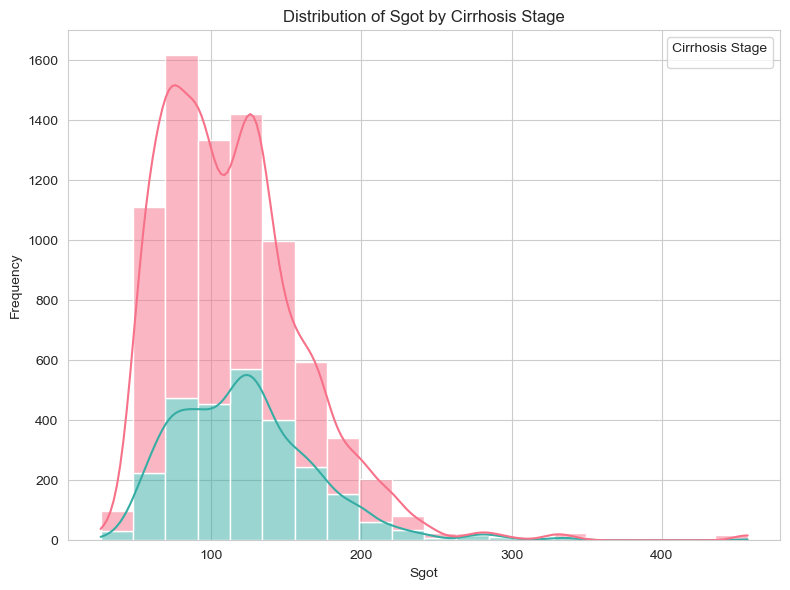

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


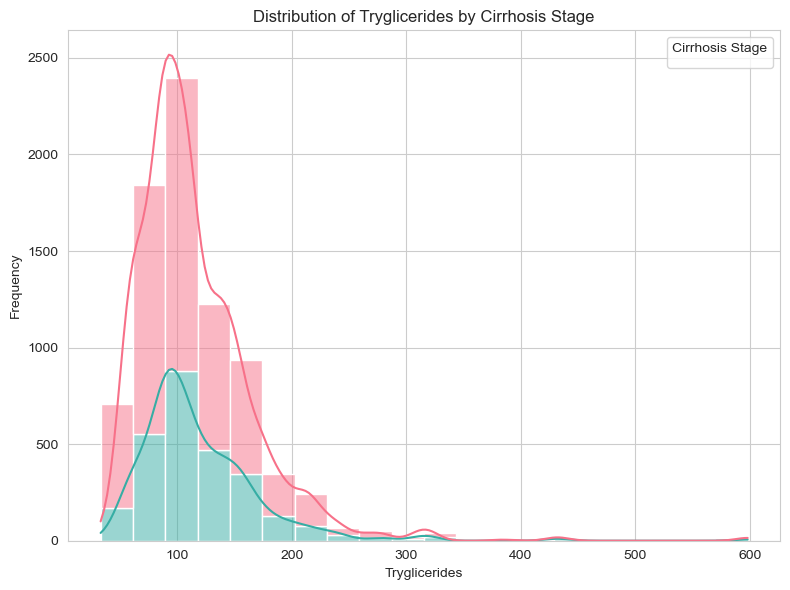

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


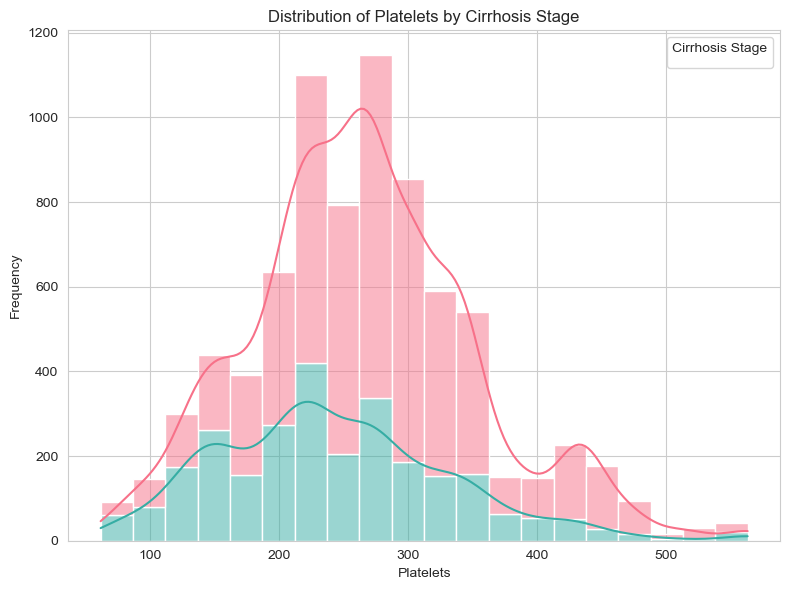

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


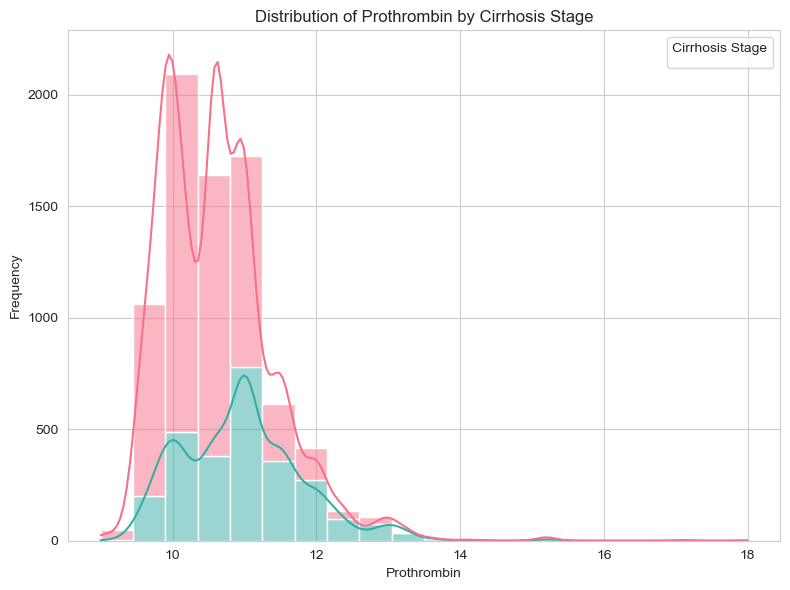

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of seaborn
sns.set_style("whitegrid")

# Define the features to visualize
features_to_visualize = ['bilirubin', 'age', 'cholesterol', 'albumin', 'copper', 'sgot', 
                         'tryglicerides', 'platelets', 'prothrombin']

# Plot the distribution of each feature grouped by cirrhosis stage
for feature in features_to_visualize:
    plt.figure(figsize=(8, 6))  # Adjust the figure size as needed
    sns.histplot(data=df, x=feature, hue='stage', kde=True, palette='husl', multiple='stack', bins=20)
    plt.title(f'Distribution of {feature.capitalize()} by Cirrhosis Stage')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Frequency')
    plt.legend(title='Cirrhosis Stage')
    plt.tight_layout()  # Ensure tight layout
    plt.show()


In [21]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Label Encoding on the Whole Dataset
label_encoder = LabelEncoder()

for col in df.columns:
    df[col] = label_encoder.fit_transform(df[col])

df.to_csv('encoded_dataset.csv', index=False)


In [22]:
df

,n_days,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,stage,status
0,97,0,85,1,0,0,0,0,20,97,69,123,227,162,13,195,7,0,2
1,350,1,162,0,0,0,0,0,6,128,87,52,210,121,38,182,20,0,0
2,414,1,333,0,0,1,1,2,30,87,88,105,130,102,4,68,27,1,2
3,351,1,189,0,0,0,0,0,3,56,83,48,237,30,46,119,17,0,0
4,69,1,252,0,0,1,0,0,8,118,98,52,174,109,46,140,16,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7900,118,0,245,0,0,0,0,0,5,93,89,30,233,40,134,175,9,0,0
7901,193,1,236,0,0,1,0,0,6,60,77,51,210,131,28,124,10,1,0
7902,205,0,10,0,0,0,1,1,17,36,55,43,106,27,12,69,37,0,2
7903,423,0,48,1,0,1,0,0,4,50,19,24,124,18,67,85,16,1,2


# Model Implementation

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier

# Split the dataset into features (X) and target variable (y)
X = df.drop(columns=['status', 'n_days', 'stage'])  # Features
y = df['stage']  # Target variable

# Split the dataset into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize variables to track the best classifier and its accuracy
best_clf = None
best_accuracy = 0.0

# Initialize and train various classifiers
classifiers = {
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Support Vector Machine": SVC(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "Gradient Boosting": GradientBoostingClassifier()
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)  # Train the classifier
    y_pred = clf.predict(X_test)  # Make predictions
    accuracy = accuracy_score(y_test, y_pred)  # Evaluate accuracy
    print(f"{name} Accuracy: {accuracy}")
    
    # Update the best classifier if current accuracy is higher
    if accuracy > best_accuracy:
        best_clf = clf
        best_accuracy = accuracy

# Save the best classifier
from joblib import dump
dump(best_clf, 'best_classifier.joblib')


Decision Tree Accuracy: 0.7115749525616698
Random Forest Accuracy: 0.7798861480075902
Support Vector Machine Accuracy: 0.7343453510436433
K-Nearest Neighbors Accuracy: 0.6888045540796964
Naive Bayes Accuracy: 0.7469955724225174
Gradient Boosting Accuracy: 0.7900063251106895


['best_classifier.joblib']

# Comparing Various Algorithm

In [24]:
import plotly.graph_objects as go

# Define classifiers and their accuracies
classifiers = ['Decision Tree', 'Random Forest', 'Support Vector Machine', 'K-Nearest Neighbors', 'Naive Bayes', 'Gradient Boosting']
accuracies = [0.7109424414927261, 0.7805186590765338, 0.7343453510436433, 0.6888045540796964, 0.7469955724225174, 0.7906388361796332]

# Calculate percentages
total_accuracy = sum(accuracies)
percentages = [(acc / total_accuracy) * 100 for acc in accuracies]

# Create traces for each classifier
traces = []
for classifier, acc, percent in zip(classifiers, accuracies, percentages):
    traces.append(go.Bar(
        x=[classifier],
        y=[acc],
        name=classifier,
        hovertemplate=f'<b>{classifier}</b><br>Accuracy: {acc:.2f} ({percent:.2f}%)',
    ))

# Layout configuration
layout = go.Layout(
    title='Classifier Accuracies',
    xaxis=dict(title='Classifier'),
    yaxis=dict(title='Accuracy'),
    barmode='stack',
    template='plotly_white',
)

# Create figure
fig = go.Figure(data=traces, layout=layout)

# Add percentages to bars
for i, (acc, percent) in enumerate(zip(accuracies, percentages)):
    fig.add_annotation(
        x=classifiers[i],
        y=acc,
        text=f'{percent:.2f}%',
        font=dict(color='black', size=10),
        showarrow=False,
        yshift=10
    )

# Show figure
fig.show()


Evaluation Metric

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

# Use the best classifier to make predictions on the test set
y_pred_best = best_clf.predict(X_test)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_best))


Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1058
           1       0.68      0.68      0.68       523

    accuracy                           0.79      1581
   macro avg       0.76      0.76      0.76      1581
weighted avg       0.79      0.79      0.79      1581



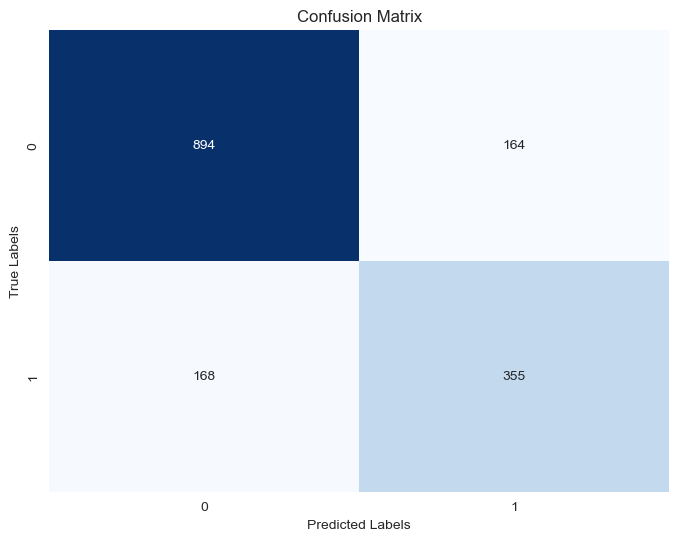

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_best)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [27]:
import plotly.graph_objs as go
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

# Define custom colors for the curves
colors = ['rgb(31, 119, 180)', 'rgb(255, 127, 14)', 'rgb(44, 160, 44)', 'rgb(214, 39, 40)', 'rgb(148, 103, 189)']

# Compute probabilities for each class
y_prob = best_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
roc_curves = []
for i in range(best_clf.n_classes_):
    fpr, tpr, _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
    roc_auc = auc(fpr, tpr)
    
    roc_curves.append(go.Scatter(x=fpr, y=tpr, mode='lines', 
                                 name=f'ROC curve (Class {i}) - AUC = {roc_auc:.2f}',
                                 line=dict(color=colors[i], width=2)))

# Create layout for ROC curve
roc_layout = go.Layout(title='Receiver Operating Characteristic (ROC) Curve',
                       xaxis=dict(title='False Positive Rate'),
                       yaxis=dict(title='True Positive Rate'),
                       hovermode='closest')

# Plot ROC curve
roc_fig = go.Figure(data=roc_curves, layout=roc_layout)
roc_fig.show()

# Compute precision-recall curve and average precision for each class
pr_curves = []
for i in range(best_clf.n_classes_):
    precision, recall, _ = precision_recall_curve(y_test, y_prob[:, i], pos_label=i)
    avg_precision = average_precision_score(y_test, y_prob[:, i], pos_label=i)
    
    pr_curves.append(go.Scatter(x=recall, y=precision, mode='lines', 
                                name=f'Precision-Recall curve (Class {i}) - AP = {avg_precision:.2f}',
                                line=dict(color=colors[i], width=2)))

# Create layout for Precision-Recall curve
pr_layout = go.Layout(title='Precision-Recall Curve',
                      xaxis=dict(title='Recall'),
                      yaxis=dict(title='Precision'),
                      hovermode='closest')

# Plot Precision-Recall curve
pr_fig = go.Figure(data=pr_curves, layout=pr_layout)
pr_fig.show()


# PREDICTION

In [28]:
# Print the features used during training
print("Features used during training:")
print(X_train.columns.tolist())

Features used during training:
['drug', 'age', 'sex', 'ascites', 'hepatomegaly', 'spiders', 'edema', 'bilirubin', 'cholesterol', 'albumin', 'copper', 'alk_phos', 'sgot', 'tryglicerides', 'platelets', 'prothrombin']


In [29]:
# Synthetic data with the features provided
synthetic_data = {
    'drug': [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
    'age': [85, 162, 333, 189, 252, 157, 217, 92, 105, 300, 11, 322],
    'sex': [1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0],
    'ascites': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'hepatomegaly': [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0],
    'spiders': [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'edema': [0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'bilirubin': [20, 6, 30, 3, 8, 3, 7, 3, 4, 6, 2, 6],
    'cholesterol': [97, 128, 87, 56, 118, 38, 105, 69, 126, 172, 53, 105],
    'albumin': [69, 87, 88, 83, 98, 80, 69, 125, 98, 93, 93, 94],
    'copper': [123, 52, 105, 48, 52, 26, 35, 28, 61, 31, 18, 51],
    'alk_phos': [227, 210, 130, 237, 174, 344, 241, 18, 318, 249, 3, 158],
    'sgot': [162, 121, 102, 30, 109, 22, 127, 10, 63, 156, 16, 127],
    'tryglicerides': [13, 38, 4, 46, 46, 18, 40, 131, 95, 85, 117, 45],
    'platelets': [195, 182, 68, 119, 140, 80, 135, 90, 119, 94, 169, 37],
    'prothrombin': [7, 20, 27, 17, 16, 25, 8, 9, 8, 16, 10, 5]
}

# Create a DataFrame from the synthetic data
synthetic_df = pd.DataFrame(synthetic_data)

# Make predictions using the best classifier
predictions = best_clf.predict(synthetic_df)

# Display the predictions
print("Predictions:")
print(predictions)


Predictions:
[0 0 1 0 0 1 0 0 0 0 0 0]


In [30]:
# Create a DataFrame with the original synthetic data and the predicted values
synthetic_with_predictions = synthetic_df.copy()  # Make a copy of the original synthetic DataFrame
synthetic_with_predictions['predicted_stage'] = predictions  # Add a new column for predicted values

# Display the DataFrame with original data and predicted values
print("Synthetic Data with Predictions:")
synthetic_with_predictions


Synthetic Data with Predictions:


,drug,age,sex,ascites,hepatomegaly,spiders,edema,bilirubin,cholesterol,albumin,copper,alk_phos,sgot,tryglicerides,platelets,prothrombin,predicted_stage
0,0,85,1,0,0,0,0,20,97,69,123,227,162,13,195,7,0
1,1,162,0,0,0,0,0,6,128,87,52,210,121,38,182,20,0
2,1,333,0,0,1,1,2,30,87,88,105,130,102,4,68,27,1
3,1,189,1,0,0,0,0,3,56,83,48,237,30,46,119,17,0
4,1,252,0,0,1,0,0,8,118,98,52,174,109,46,140,16,0
5,0,157,1,0,1,0,0,3,38,80,26,344,22,18,80,25,1
6,1,217,0,0,0,0,0,7,105,69,35,241,127,40,135,8,0
7,1,92,0,0,1,0,0,3,69,125,28,18,10,131,90,9,0
8,0,105,1,0,0,0,0,4,126,98,61,318,63,95,119,8,0
9,0,300,0,0,0,0,0,6,172,93,31,249,156,85,94,16,0
